# LASSO with ResNet Features

In [1]:
import os
import numpy as np
import torch
from torch import nn
from torchvision import transforms
from torchvision.ops.boxes import box_iou
import matplotlib.pyplot as plt
from PIL import Image
import cv2

In [2]:
TYPES = ['Pedestrian', 'Cyclist', 'Pets']
CARRY_ONS = ['backpack', 'shoulder-bag', 'hand-bag', 'luggage', 'umbrella', 'misc']

In [3]:
def idof(y):
    return y[0]

def typeof(y):
    return TYPES[y[1]]

def is_occluded(y):
    return y[2] == 1

def carry_ons(y):
    c = y[3:]
    return ', '.join([CARRY_ONS[i] for i in range(len(c)) if c[i] == 1])

## Sklearn

In [4]:
from sklearn.decomposition import SparseCoder

### ViaCrops

In [5]:
root = 'PennFudanPed/ViaCrops/'

D = np.load(root + 'train_dict.npy')
y = np.load(root + 'test_dict.npy')
Dl = np.load(root + 'train_labels.npy')
yl = np.load(root + 'test_labels.npy')
Df = np.load(root + 'train_feats.npy')
yf = np.load(root + 'test_feats.npy')

D.shape, y.shape, Dl.shape, yl.shape, Df.shape, yf.shape

((434, 128, 64), (100, 128, 64), (434, 9), (100, 9), (434, 2048), (100, 2048))

In [6]:
dim = 2048
coder = SparseCoder(
     dictionary=Df, transform_algorithm='lasso_lars',
     transform_alpha=1e0,
)

In [7]:
x = coder.transform(yf)
x.shape

(100, 434)

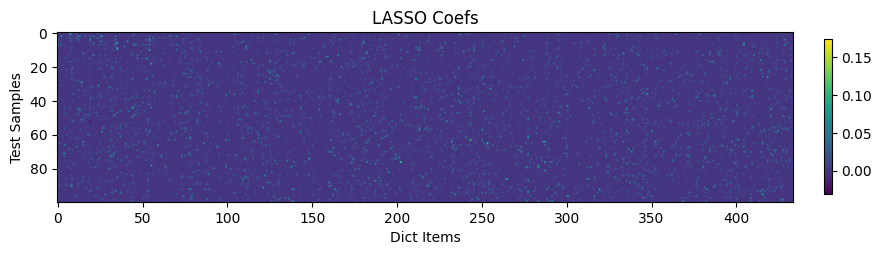

In [8]:
plt.figure(figsize=(10, 4))
im = plt.imshow(x)
plt.xlabel('Dict Items')
plt.ylabel('Test Samples')
plt.title('LASSO Coefs')
plt.colorbar(im, fraction=0.010, pad=0.04)

In [62]:
def sci(x):
    # x -> [n, k]
    k = x.shape[1]
    l1 = np.linalg.norm(x, ord=1, axis=-1)
    return (k * np.max(np.abs(x), axis=-1) / l1 - 1) / (k - 1)

Text(0, 0.5, 'SCI')

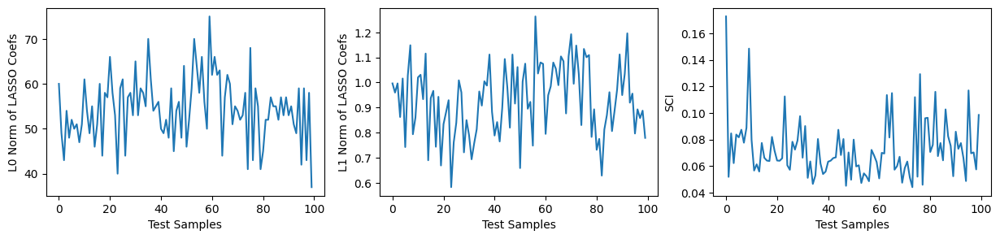

In [63]:
l0 = np.linalg.norm(x, ord=0, axis=1)
l1 = np.linalg.norm(x, ord=1, axis=1)
s = sci(x)

fig, ax = plt.subplots(1, 3, figsize=(15, 3))

ax[0].plot(l0)
ax[0].set_xlabel('Test Samples')
ax[0].set_ylabel('L0 Norm of LASSO Coefs')
ax[1].plot(l1)
ax[1].set_xlabel('Test Samples')
ax[1].set_ylabel('L1 Norm of LASSO Coefs')
ax[2].plot(s)
ax[2].set_xlabel('Test Samples')
ax[2].set_ylabel('SCI')

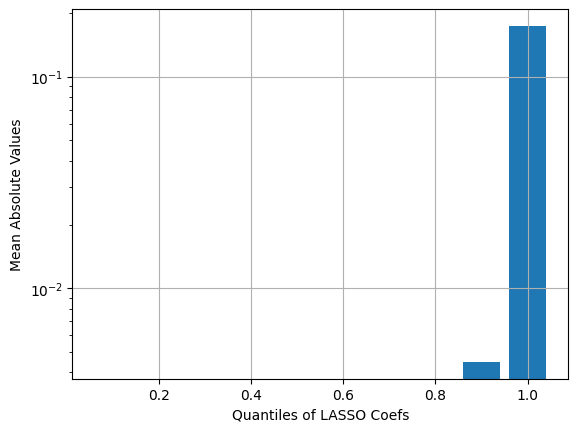

In [64]:
qs = np.arange(0.1, 1.1, 0.1)
c = []
for q in qs:
    c.append(np.quantile(np.abs(x), q))
plt.bar(qs, c, width=0.08)
plt.yscale('log')
plt.xlabel('Quantiles of LASSO Coefs')
plt.ylabel('Mean Absolute Values')
plt.grid('on')

In [65]:
def show_topk(i, k):
    ids = np.argsort(np.abs(x[i]))[::-1][:k]
    title = '{}{} ({})\n{}'.format(
        typeof(yl[i]), idof(yl[i]), 'OCC' if is_occluded(yl[i]) else 'NOC',
        'carry-on: ' + carry_ons(yl[i])
    )
    r = 2
    c = (k + 1) // 2
    fig, ax = plt.subplots(r, c, figsize=(c*3, 9))
    ax[0][0].imshow(y[i].reshape(*D.shape[-2:]))
    ax[0][0].axis('off')
    ax[0][0].set_title(title + '\nSCI = {:.3f}'.format(s[i]))
    for j, ii in enumerate(ids):
        title = '{}{} ({})\n{}'.format(
            typeof(Dl[ii]), idof(Dl[ii]), 'OCC' if is_occluded(Dl[ii]) else 'NOC',
            'carry-on: ' + carry_ons(Dl[ii])
        )
        ax[(j+1)//c][(j+1)%c].imshow(D[ii].reshape(*D.shape[-2:]))
        ax[(j+1)//c][(j+1)%c].axis('off')
        ax[(j+1)//c][(j+1)%c].set_title(title + '\nCoef = {:.3f}'.format(x[i, ii]))

In [66]:
ids = np.argsort(s)[-5:]
ids, l1[ids], l0[ids], s[ids]

(array([82, 95, 76,  9,  0]),
 array([0.62837714, 0.7962287 , 1.1007664 , 0.859835  , 0.99625367],
       dtype=float32),
 array([52., 42., 43., 51., 60.], dtype=float32),
 array([0.11592487, 0.11696924, 0.12926267, 0.14848828, 0.17273434],
       dtype=float32))

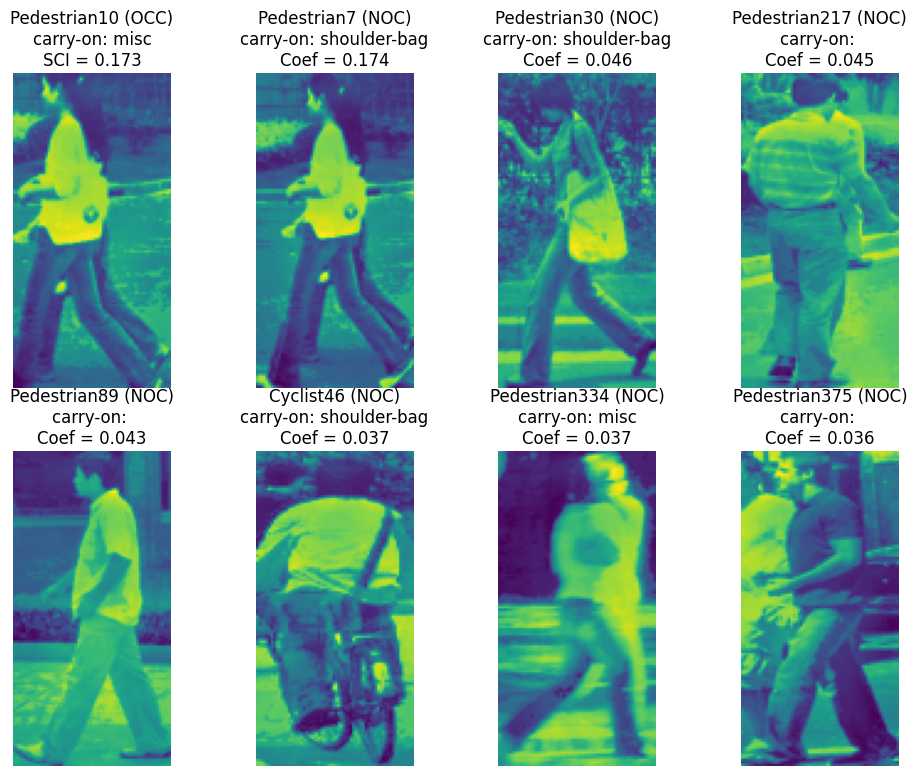

In [67]:
show_topk(0, k=7)

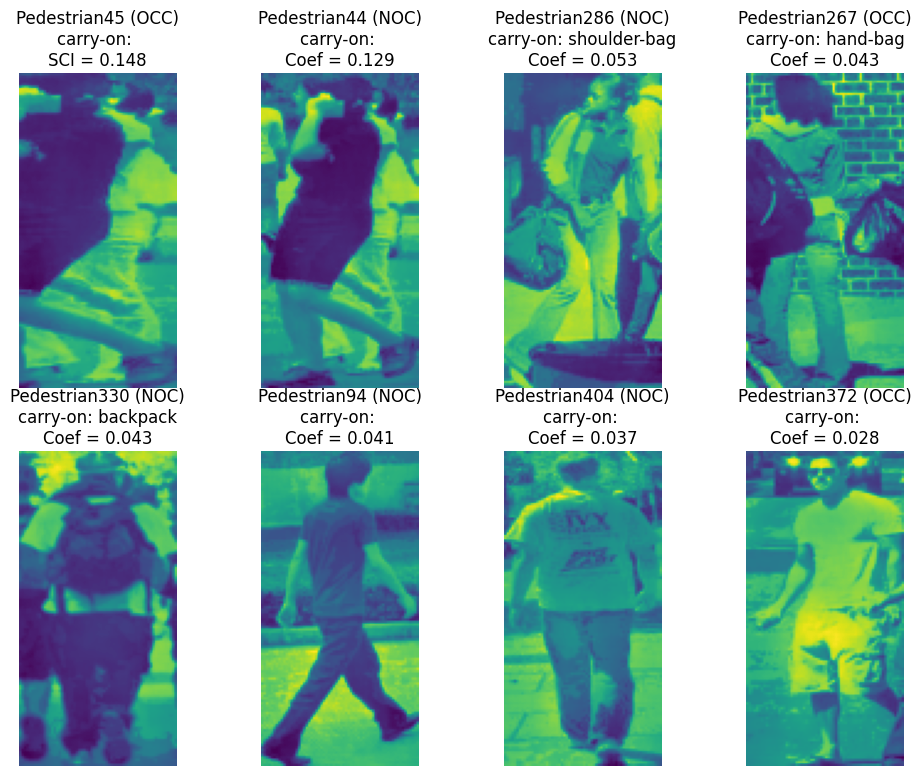

In [68]:
show_topk(9, k=7)

In [69]:
ids = np.argsort(s)[:5]
ids, l1[ids], l0[ids], s[ids]

(array([73, 47, 77, 34, 53]),
 array([1.0328681 , 1.1112896 , 1.1091596 , 0.96390855, 0.89510214],
       dtype=float32),
 array([58., 56., 59., 55., 70.], dtype=float32),
 array([0.04406478, 0.04508838, 0.04585855, 0.04650912, 0.04720369],
       dtype=float32))

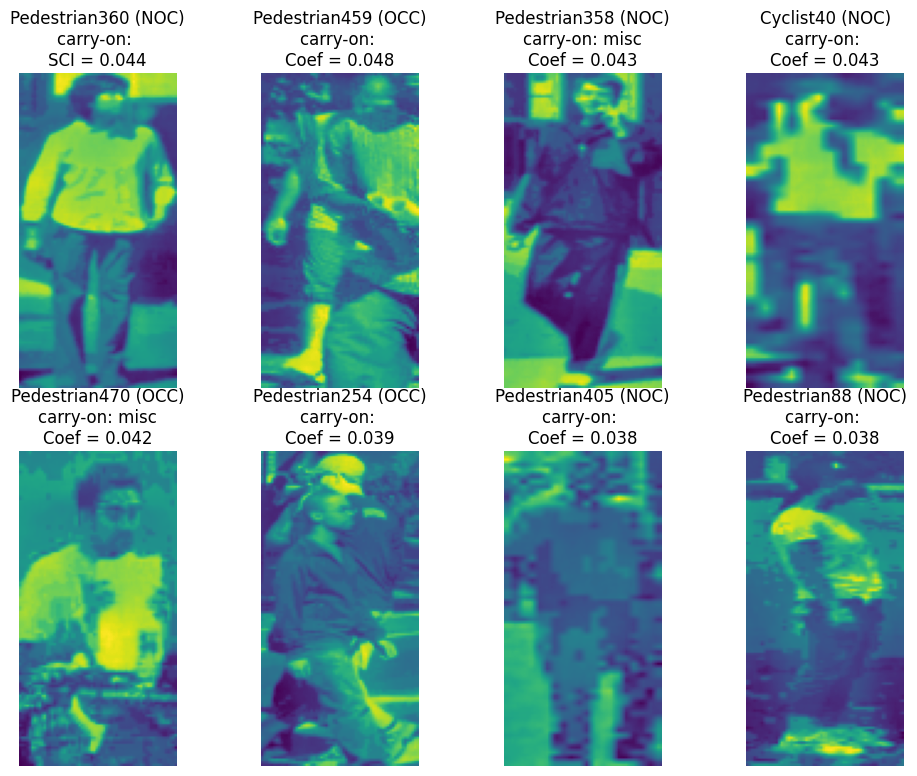

In [70]:
show_topk(73, k=7)

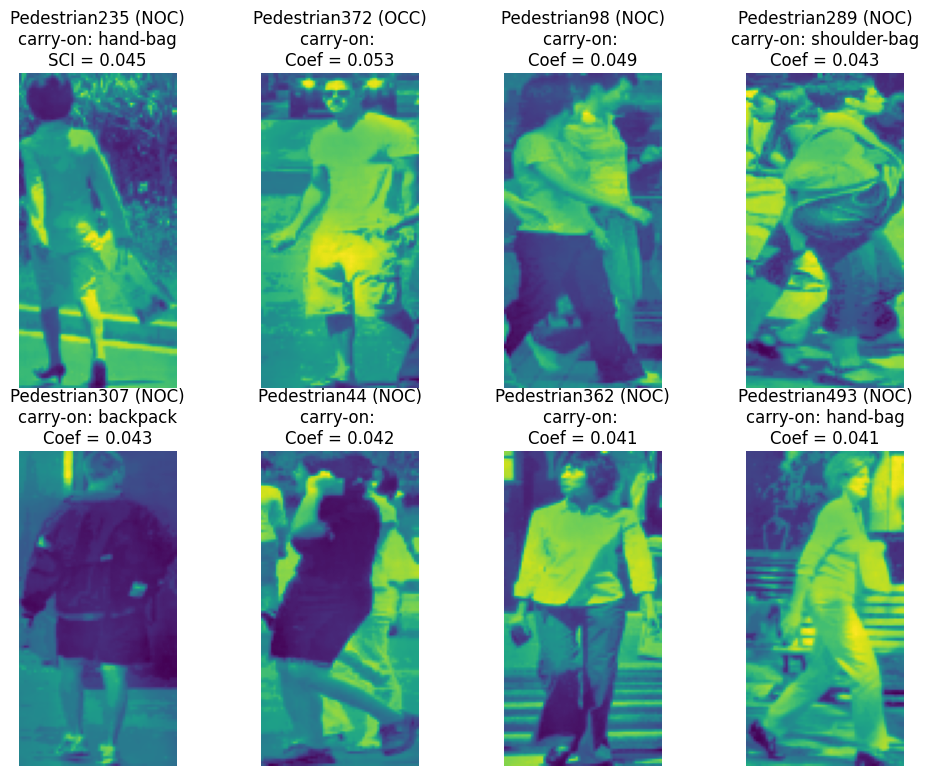

In [71]:
show_topk(47, k=7)

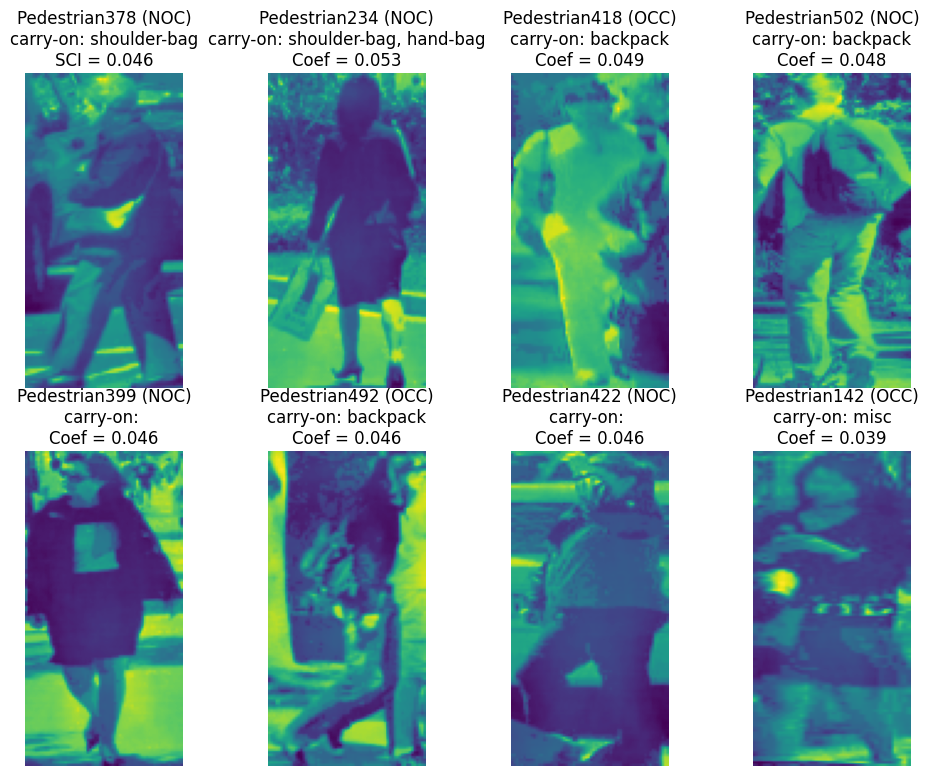

In [72]:
show_topk(77, k=7)

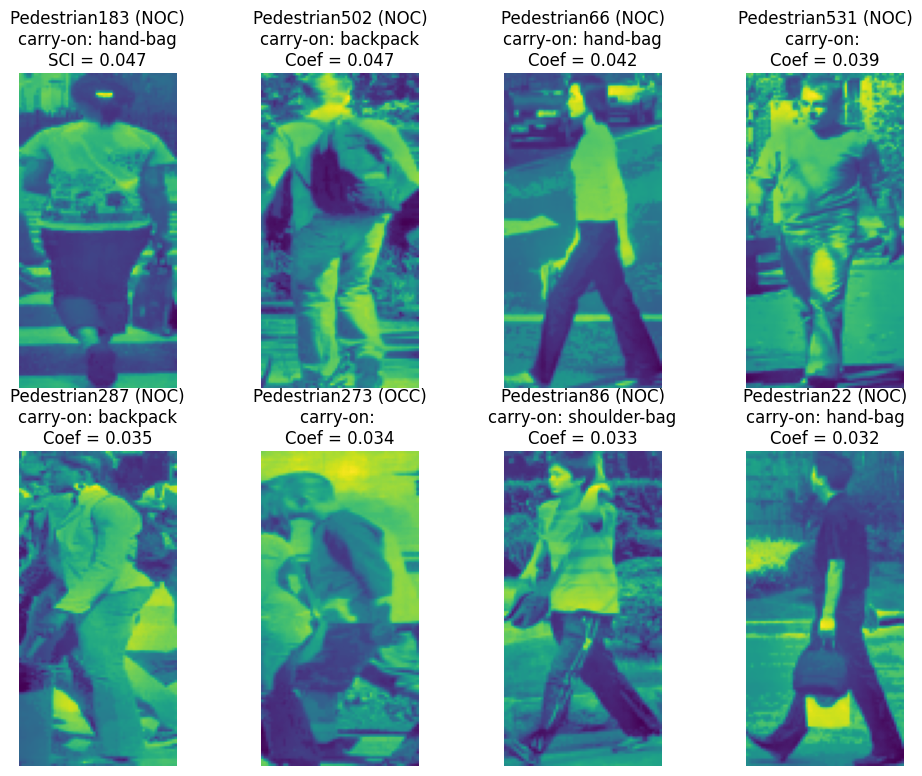

In [73]:
show_topk(34, k=7)

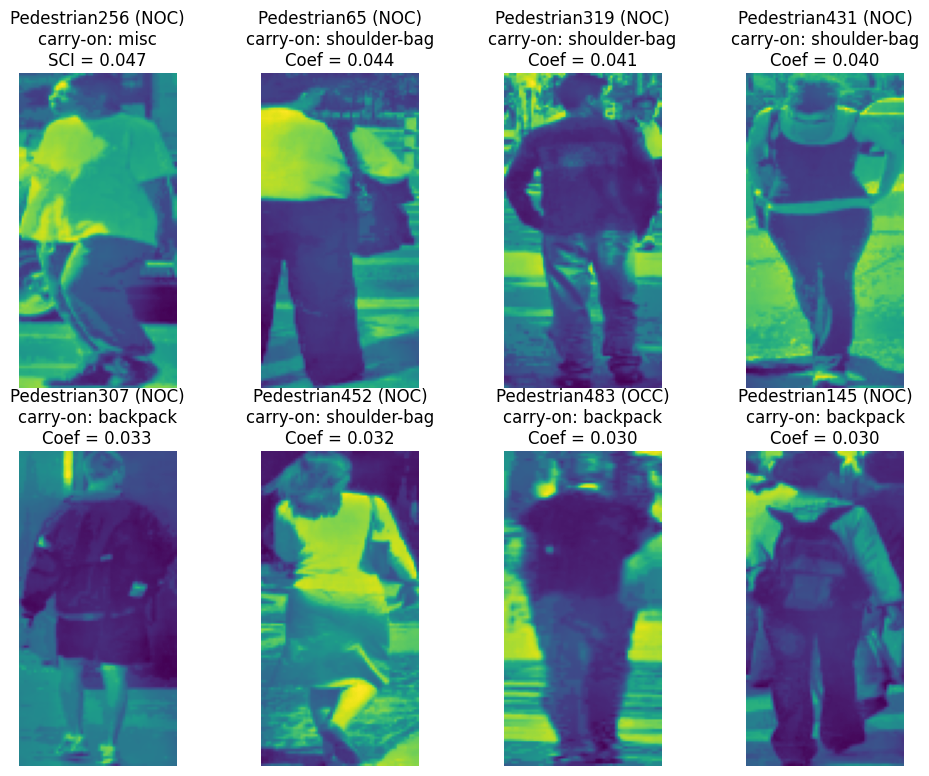

In [74]:
show_topk(53, k=7)

## Predict

### Predicting Types

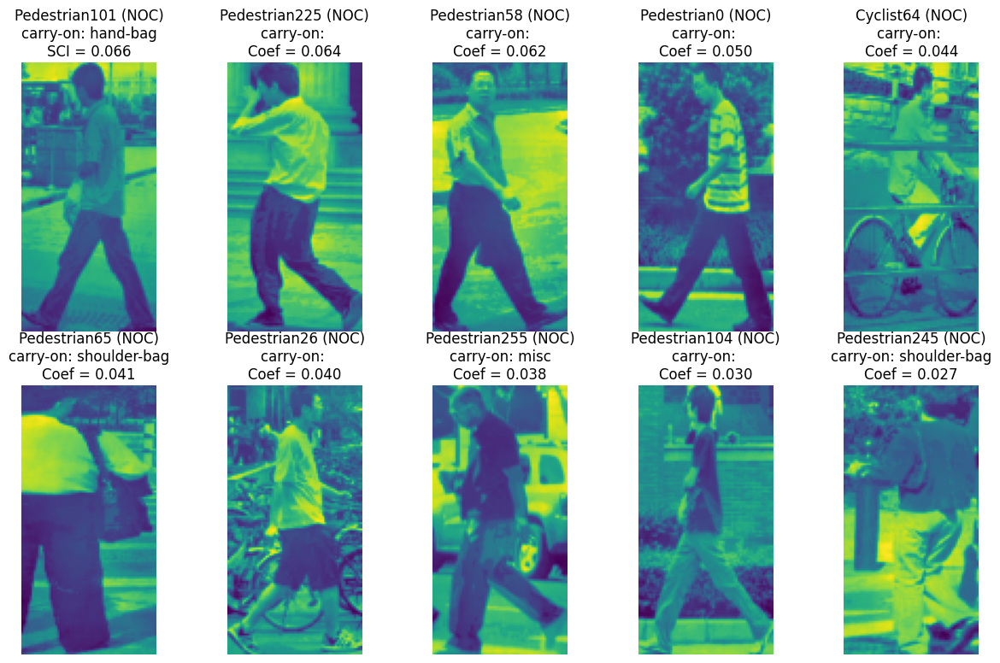

In [29]:
show_topk(15, k=9)

In [30]:
def sigmoid(x):
    return 1/(1 + np.exp(-x))

def softmax(x):
    s = np.exp(x)
    return s / np.sum(s, axis=-1)

def onehot(x, k):
    # x [n]
    x = np.array(x).astype(int)
    if len(x.shape) == 0:
        ret = np.zeros(k)
        ret[x] = 1
    else:
        ret = np.zeros(x.shape[0], k)
        ret[:, x] = 1
    return ret

def crossentropy(p, y):
    # p, y -> [n, k]
    eps = 1e-8
    ret = - np.sum(y * np.log(p + eps))
    if len(y.shape) > 0: ret /= y.shape[0]
    return ret

In [31]:
def predict_type(i, k):
    # Dl -> [n_train, 9]
    # xi -> [n_train]
    xi = np.abs(x[i])
    ids = np.argsort(xi)[-k:]
    xi = xi[ids]
    xi /= np.sum(xi)
    pt = np.zeros(len(TYPES))
    for j in range(len(TYPES)):
        m = Dl[ids, 1] == j
        pt[j] = np.sum(xi[m])
    return pt

i = 15
k = 10
gt = yl[i, 1]
pr = predict_type(i, k)
gt, pr, crossentropy(pr, onehot(gt, len(TYPES)))

(0, array([0.89499843, 0.10500161, 0.        ]), 0.03697776745945065)

**Missing all cyclists**

Type detection F1 score: 0.9701010101010101


array([[98,  0],
       [ 2,  0]])

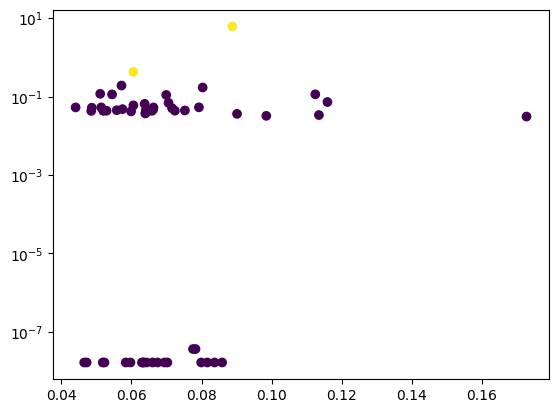

In [32]:
from sklearn.metrics import f1_score, confusion_matrix

prs = []
gts = []
ces = []
scis = sci(x)

for i in range(len(yl)):
    gt = yl[i, 1]
    pr = predict_type(i, k=7)
    prs.append(np.argmax(pr))
    gts.append(gt)
    ces.append(crossentropy(pr, onehot(gt, len(TYPES))))

plt.scatter(scis, ces, c=gts)
plt.yscale('log')
print('Type detection F1 score:', f1_score(gts, prs, average='weighted'))
confusion_matrix(gts, prs)

### Predicting Occlusions

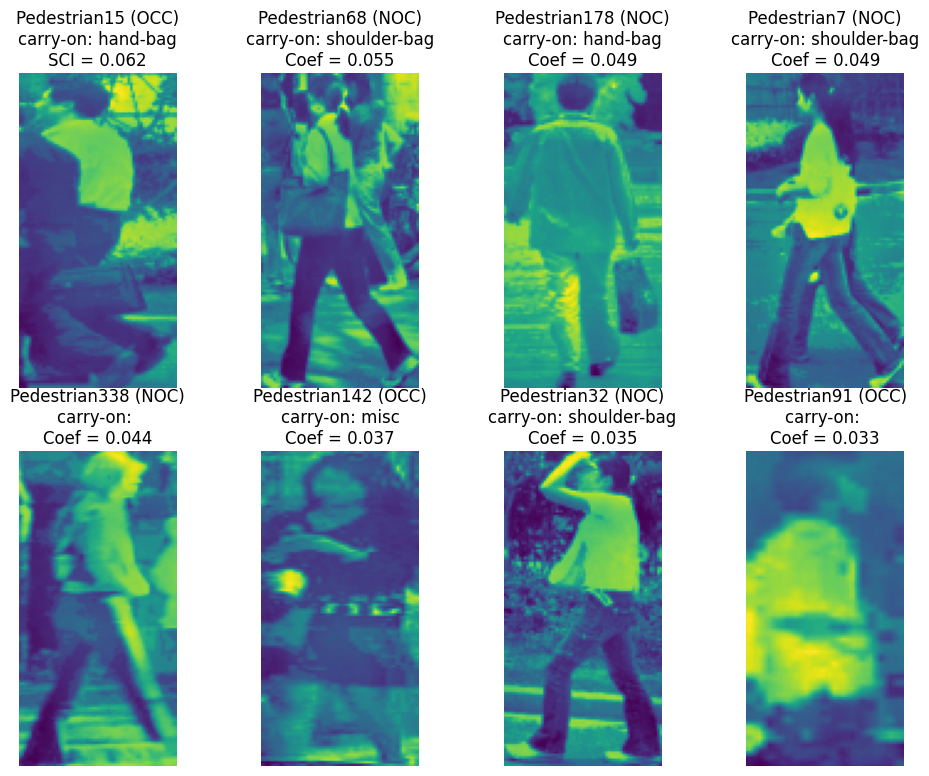

In [43]:
show_topk(3, 7)

In [47]:
def predict_occ(i, k):
    # Dl -> [n_train, 9]
    # xi -> [n_train]
    xi = np.abs(x[i])
    ids = np.argsort(xi)[::-1][:k]
    xi = xi[ids]
    #print(Dl[ids, 2], ids)
    occ = np.sum(Dl[ids, 2] * xi)
    return occ# / np.sum(xi)

i = 3
k = 10
gt = yl[i, 2]
pr = predict_occ(i, k)
gt, pr, crossentropy(pr, gt)

(1, 0.10219677910208702, 2.28085501949388)

Type detection F1 score: 0.7111111111111111


array([[80,  0],
       [20,  0]])

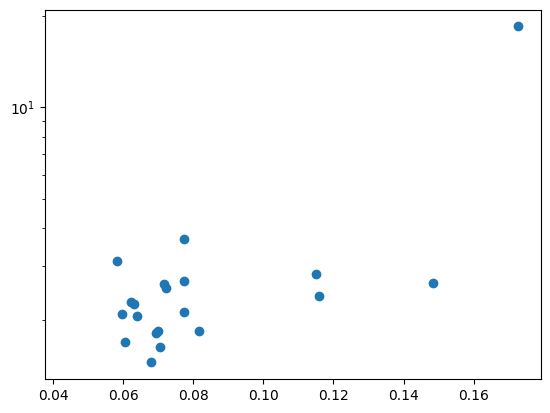

In [48]:
from sklearn.metrics import f1_score, confusion_matrix

prs = []
gts = []
ces = []
scis = sci(x)

for i in range(len(yl)):
    gt = yl[i, 2]
    pr = predict_occ(i, k=10)
    prs.append(np.round(pr))
    gts.append(gt)
    ces.append(crossentropy(pr, gt))

plt.scatter(scis, ces)
plt.yscale('log')
print('Type detection F1 score:', f1_score(gts, prs, average='weighted'))
confusion_matrix(gts, prs)

### ViaCropsNOC

In [123]:
root = 'PennFudanPed/ViaCropsNOC/'

D = np.load(root + 'train_dict.npy')
y = np.load(root + 'test_dict.npy')
Dl = np.load(root + 'train_labels.npy')
yl = np.load(root + 'test_labels.npy')
Df = np.load(root + 'train_feats.npy')
yf = np.load(root + 'test_feats.npy')

D.shape, y.shape, Dl.shape, yl.shape, Df.shape, yf.shape

((200, 128, 64), (334, 128, 64), (200, 9), (334, 9), (200, 2048), (334, 2048))

In [124]:
dim = 2048
coder = SparseCoder(
     dictionary=Df, transform_algorithm='lasso_lars',
     transform_alpha=1e0,
)

In [125]:
x = coder.transform(yf)
x.shape

/opt/anaconda3/envs/torch/lib/python3.11/site-packages/sklearn/linear_model/_least_angle.py:669: ConvergenceWarning: Early stopping the lars path, as the residues are small and the current value of alpha is no longer well controlled. 126 iterations, alpha=6.310e-04, previous alpha=6.292e-04, with an active set of 105 regressors.
  warnings.warn(
/opt/anaconda3/envs/torch/lib/python3.11/site-packages/sklearn/linear_model/_least_angle.py:669: ConvergenceWarning: Early stopping the lars path, as the residues are small and the current value of alpha is no longer well controlled. 118 iterations, alpha=6.377e-04, previous alpha=6.374e-04, with an active set of 99 regressors.
  warnings.warn(
/opt/anaconda3/envs/torch/lib/python3.11/site-packages/sklearn/linear_model/_least_angle.py:669: ConvergenceWarning: Early stopping the lars path, as the residues are small and the current value of alpha is no longer well controlled. 110 iterations, alpha=5.587e-04, previous alpha=5.586e-04, with an acti

(334, 200)

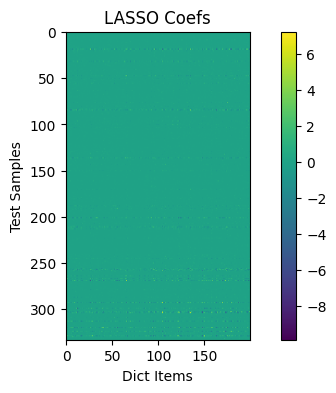

In [126]:
plt.figure(figsize=(10, 4))
im = plt.imshow(x)
plt.xlabel('Dict Items')
plt.ylabel('Test Samples')
plt.title('LASSO Coefs')
plt.colorbar(im, fraction=0.02, pad=0.04)

In [127]:
def sci(x):
    # x -> [n, k]
    k = x.shape[1]
    l1 = np.linalg.norm(x, ord=1, axis=-1)
    return (k * np.max(np.abs(x), axis=-1) / l1 - 1) / (k - 1)

Text(0, 0.5, 'SCI')

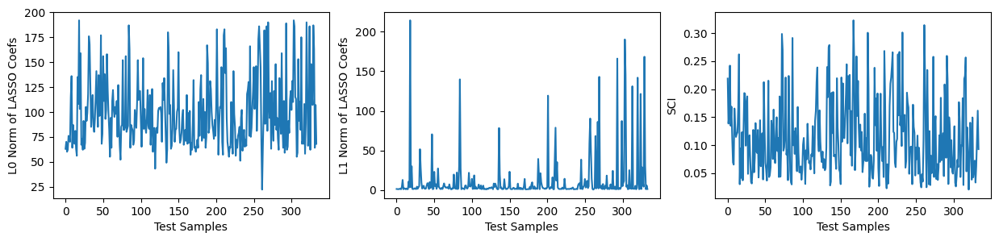

In [128]:
l0 = np.linalg.norm(x, ord=0, axis=1)
l1 = np.linalg.norm(x, ord=1, axis=1)
s = sci(x)

fig, ax = plt.subplots(1, 3, figsize=(15, 3))

ax[0].plot(l0)
ax[0].set_xlabel('Test Samples')
ax[0].set_ylabel('L0 Norm of LASSO Coefs')
ax[1].plot(l1)
ax[1].set_xlabel('Test Samples')
ax[1].set_ylabel('L1 Norm of LASSO Coefs')
ax[2].plot(s)
ax[2].set_xlabel('Test Samples')
ax[2].set_ylabel('SCI')

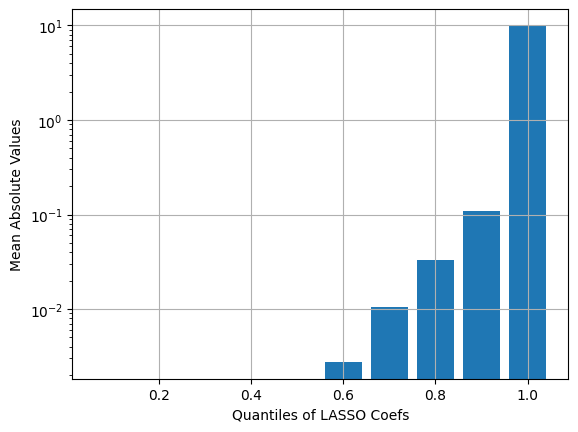

In [129]:
qs = np.arange(0.1, 1.1, 0.1)
c = []
for q in qs:
    c.append(np.quantile(np.abs(x), q))
plt.bar(qs, c, width=0.08)
plt.yscale('log')
plt.xlabel('Quantiles of LASSO Coefs')
plt.ylabel('Mean Absolute Values')
plt.grid('on')

In [130]:
def show_topk(i, k):
    ids = np.argsort(np.abs(x[i]))[::-1][:k]
    title = '{}{} ({})\n{}'.format(
        typeof(yl[i]), idof(yl[i]), 'OCC' if is_occluded(yl[i]) else 'NOC',
        'carry-on: ' + carry_ons(yl[i])
    )
    r = 2
    c = (k + 1) // 2
    fig, ax = plt.subplots(r, c, figsize=(c*3, 9))
    ax[0][0].imshow(Image.open(root + 'test_raw/{:04}.png'.format(idof(yl[i]))))
    ax[0][0].axis('off')
    ax[0][0].set_title(title + '\nSCI = {:.3f}'.format(s[i]))
    for j, ii in enumerate(ids):
        title = '{}{} ({})\n{}'.format(
            typeof(Dl[ii]), idof(Dl[ii]), 'OCC' if is_occluded(Dl[ii]) else 'NOC',
            'carry-on: ' + carry_ons(Dl[ii])
        )
        ax[(j+1)//c][(j+1)%c].imshow(Image.open(root + 'train_raw/{:04}.png'.format(idof(Dl[ii]))))
        ax[(j+1)//c][(j+1)%c].axis('off')
        ax[(j+1)//c][(j+1)%c].set_title(title + '\nCoef = {:.3f}'.format(x[i, ii]))

In [131]:
ids = np.argsort(s)[-5:]
ids, l1[ids], l0[ids], s[ids]

(array([ 72, 186, 232, 261, 167]),
 array([0.94172454, 1.3370924 , 1.1776704 , 0.40701222, 1.4043242 ],
       dtype=float32),
 array([66., 64., 51., 22., 69.], dtype=float32),
 array([0.29845348, 0.30058166, 0.30105332, 0.31422922, 0.322727  ],
       dtype=float32))

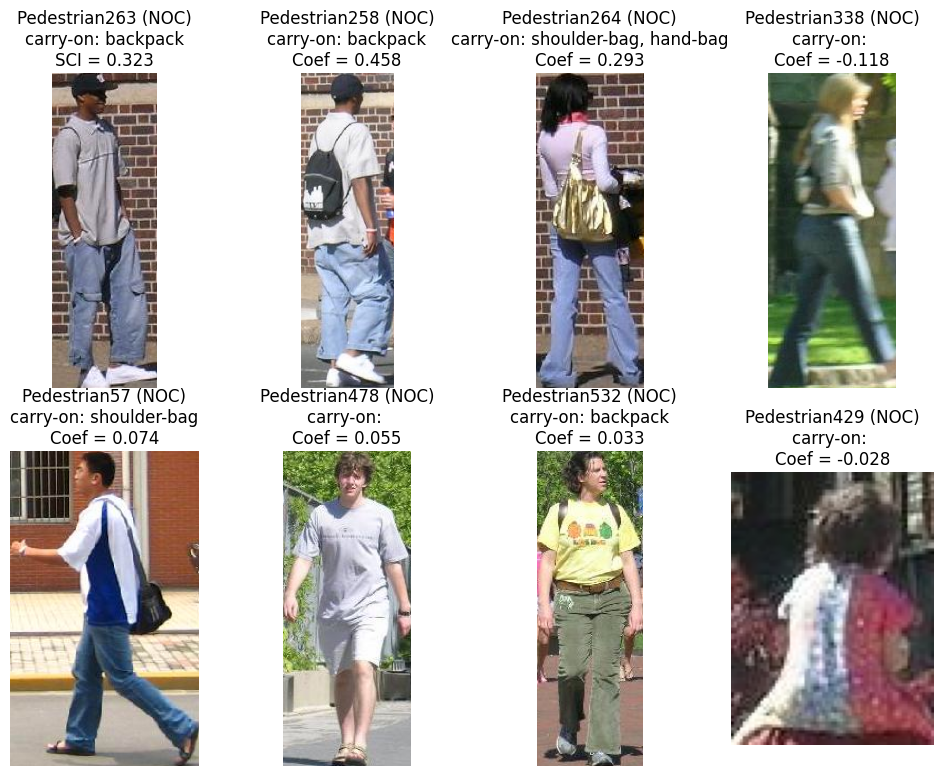

In [132]:
show_topk(167, k=7)

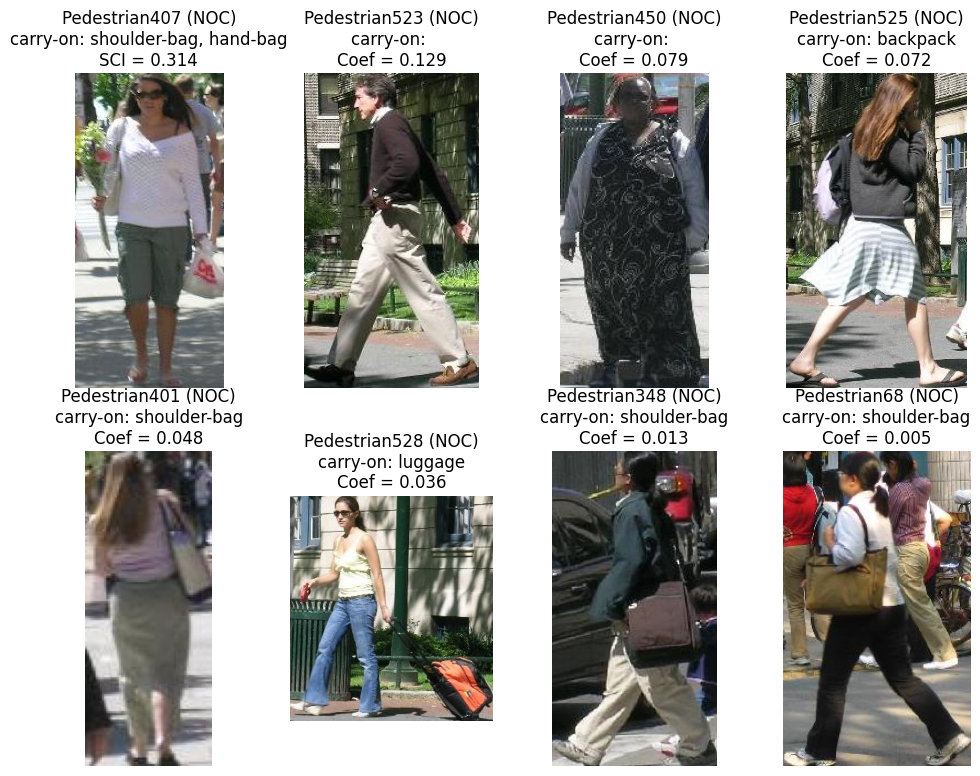

In [133]:
show_topk(261, k=7)

In [134]:
ids = np.argsort(s)[:5]
ids, l1[ids], l0[ids], s[ids]

(array([320, 211, 257, 264, 188]),
 array([141.94446,  78.69579,  90.31741,  68.07847,  39.19287],
       dtype=float32),
 array([190., 183., 186., 182., 167.], dtype=float32),
 array([0.02057153, 0.02285486, 0.02453753, 0.02477145, 0.02564607],
       dtype=float32))

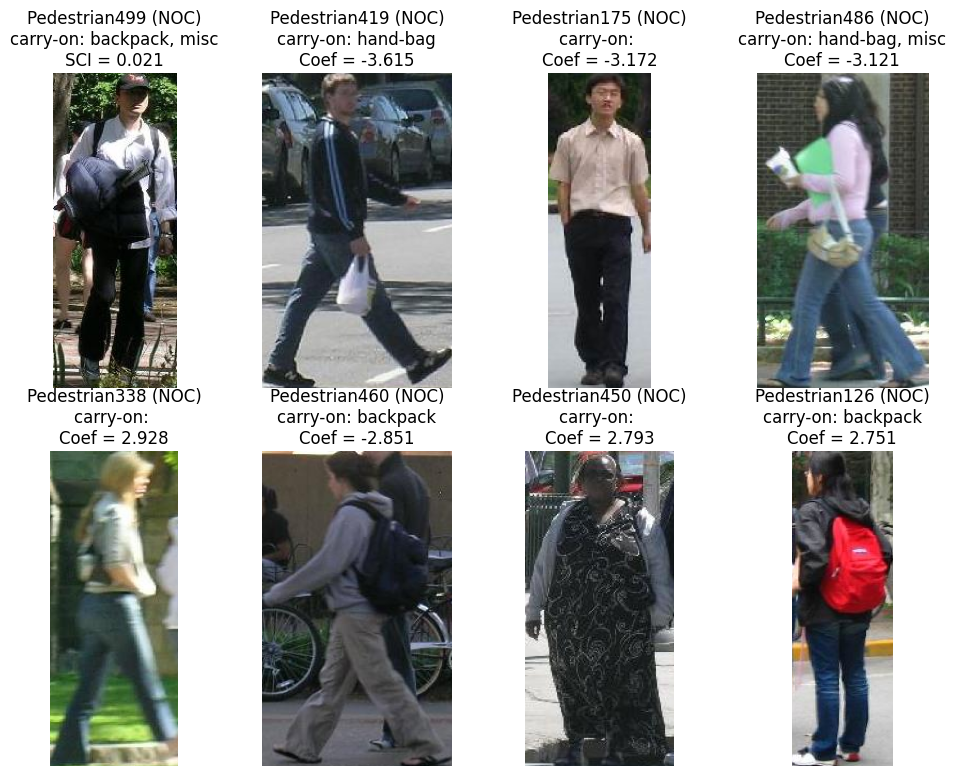

In [135]:
show_topk(320, k=7)

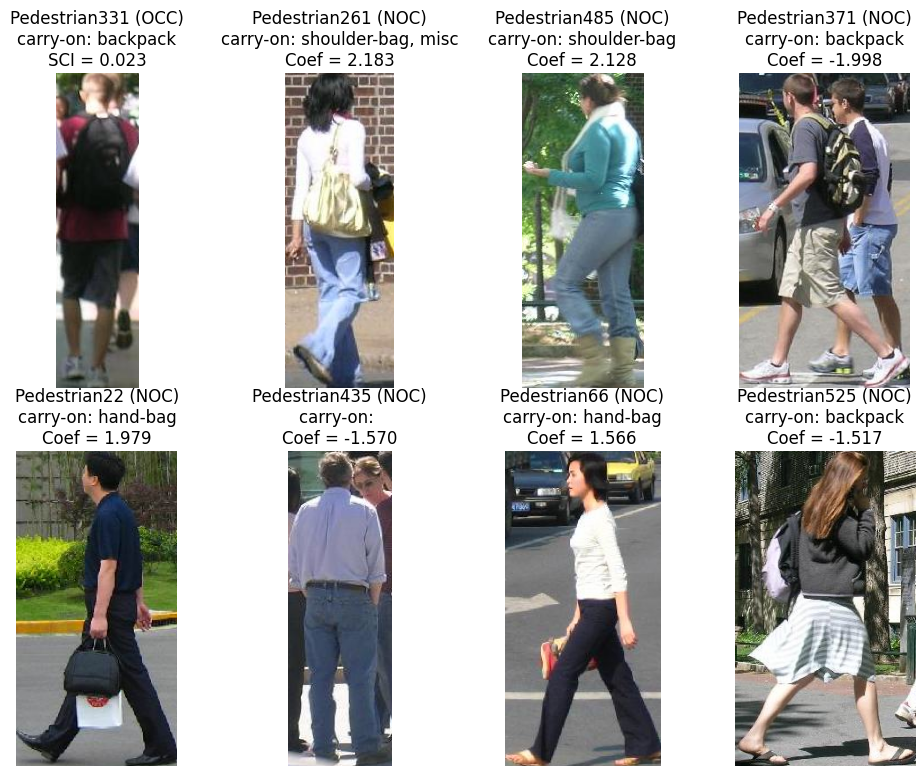

In [136]:
show_topk(211, k=7)

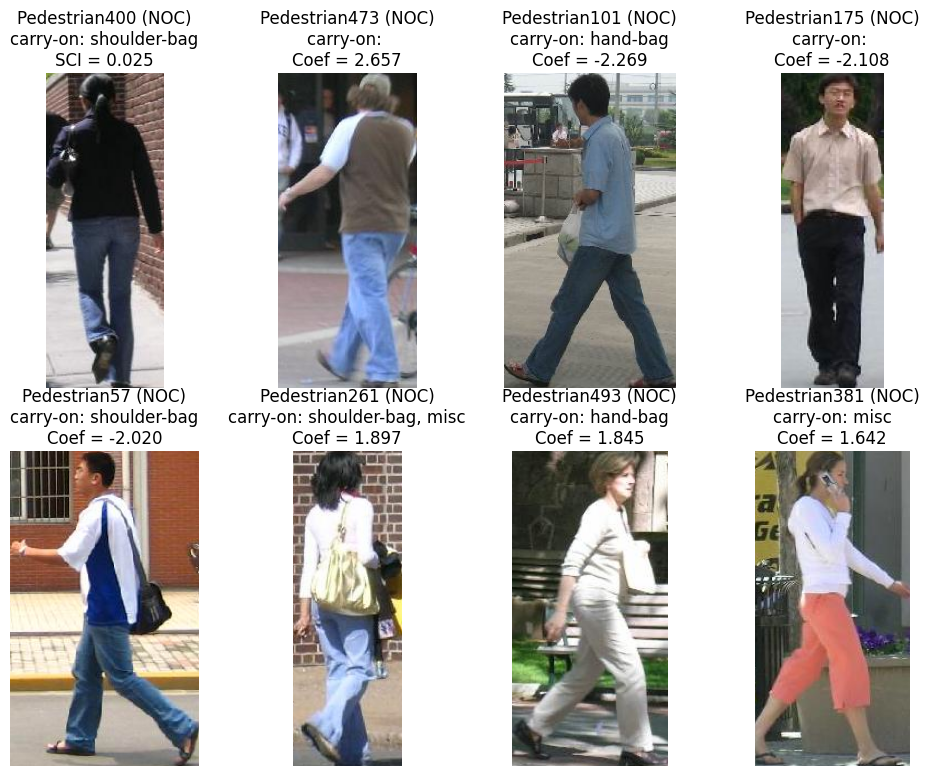

In [137]:
show_topk(257, k=7)

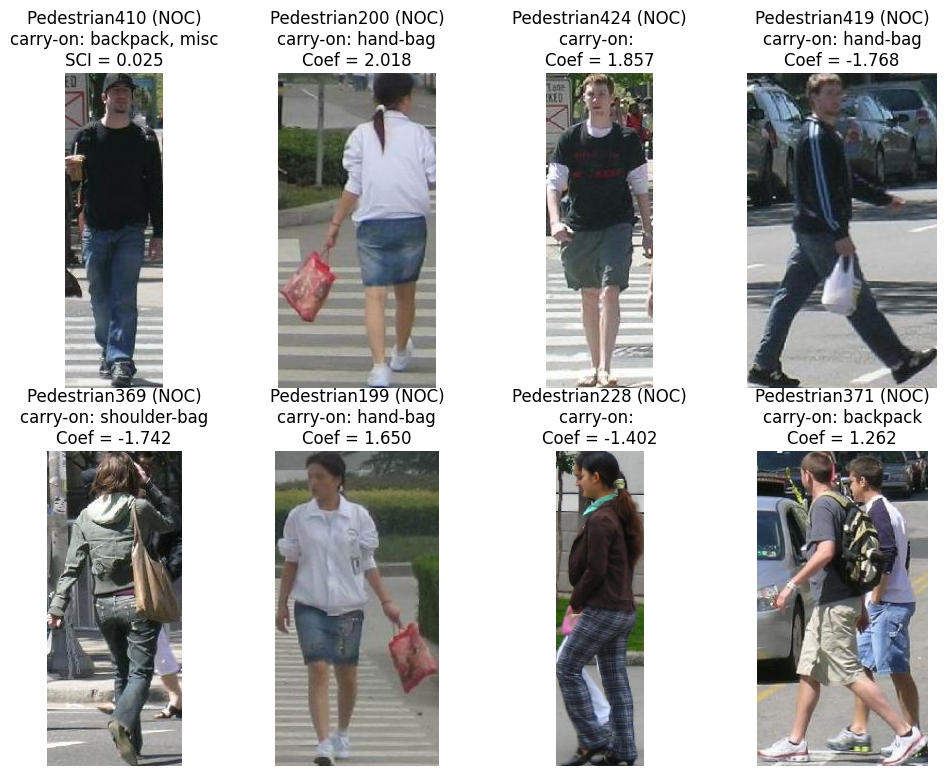

In [138]:
show_topk(264, k=7)

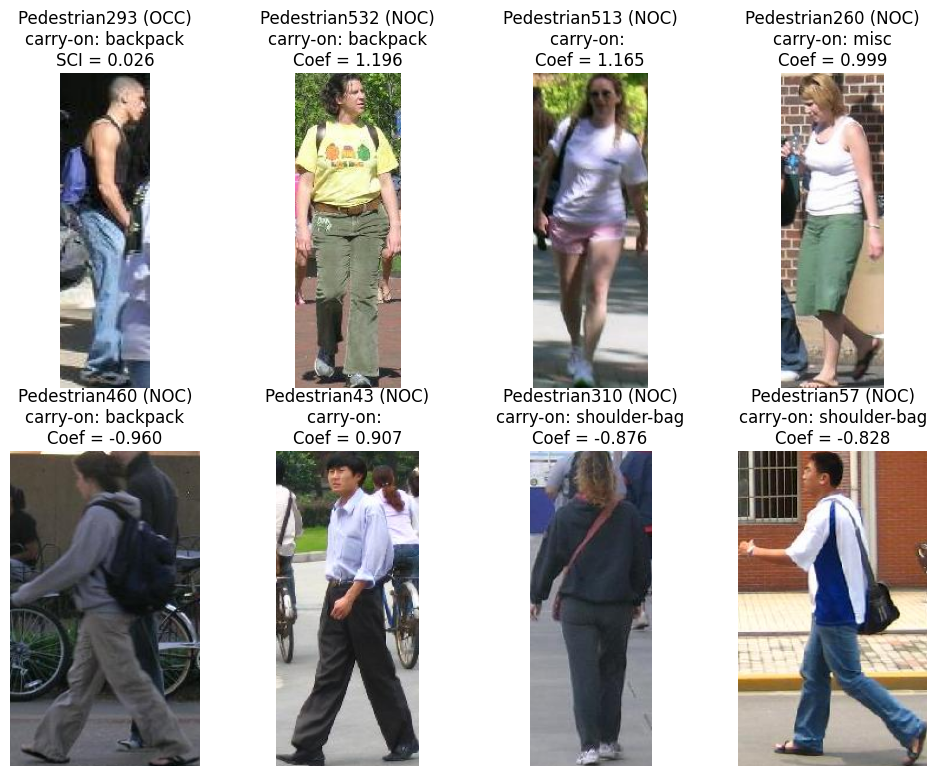

In [139]:
show_topk(188, k=7)

## Predict

### Predicting Types

In [140]:
cyclists = np.where(yl[:, 1] == 1)[0]
len(cyclists)

22

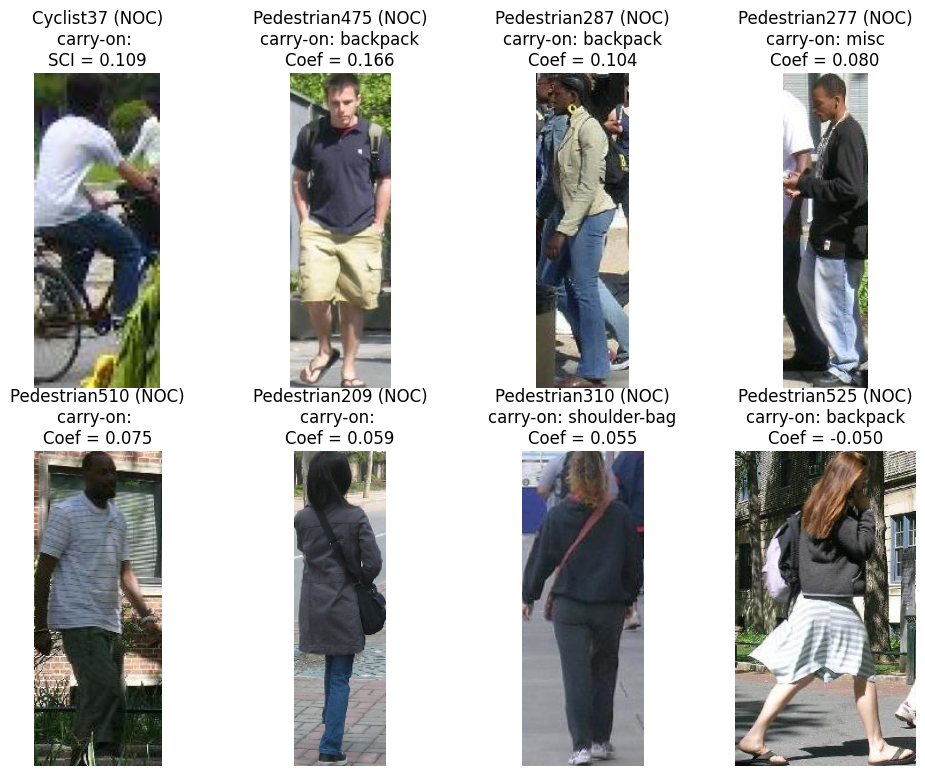

In [141]:
show_topk(cyclists[1], 7)

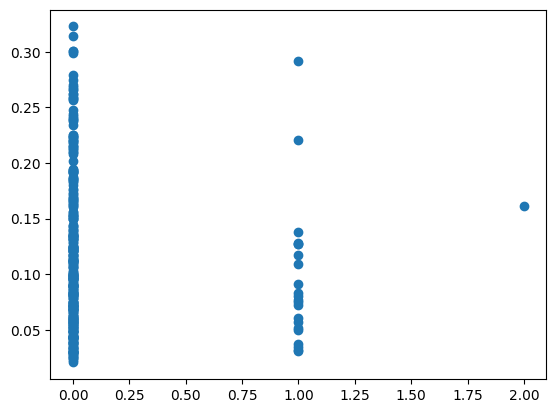

In [142]:
plt.scatter(yl[:, 1], s)

**Missing all cyclists**

Type detection F1 score: 0.8979343638304786


array([[311,   0,   0],
       [ 22,   0,   0],
       [  1,   0,   0]])

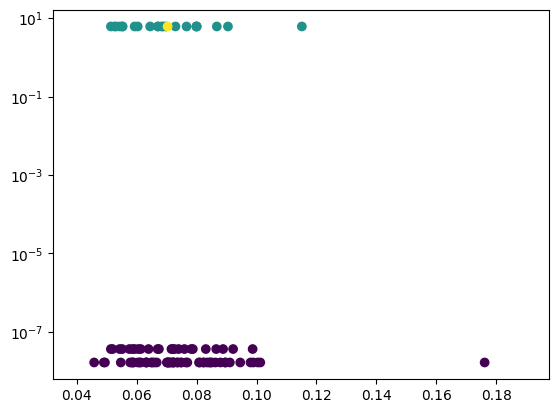

In [106]:
from sklearn.metrics import f1_score, confusion_matrix

prs = []
gts = []
ces = []
scis = sci(x)

for i in range(len(yl)):
    gt = yl[i, 1]
    pr = predict_type(i, k=7)
    prs.append(np.argmax(pr))
    gts.append(gt)
    ces.append(crossentropy(pr, onehot(gt, len(TYPES))))

plt.scatter(scis, ces, c=gts)
plt.yscale('log')
print('Type detection F1 score:', f1_score(gts, prs, average='weighted'))
confusion_matrix(gts, prs)

### Predicting Occlusions

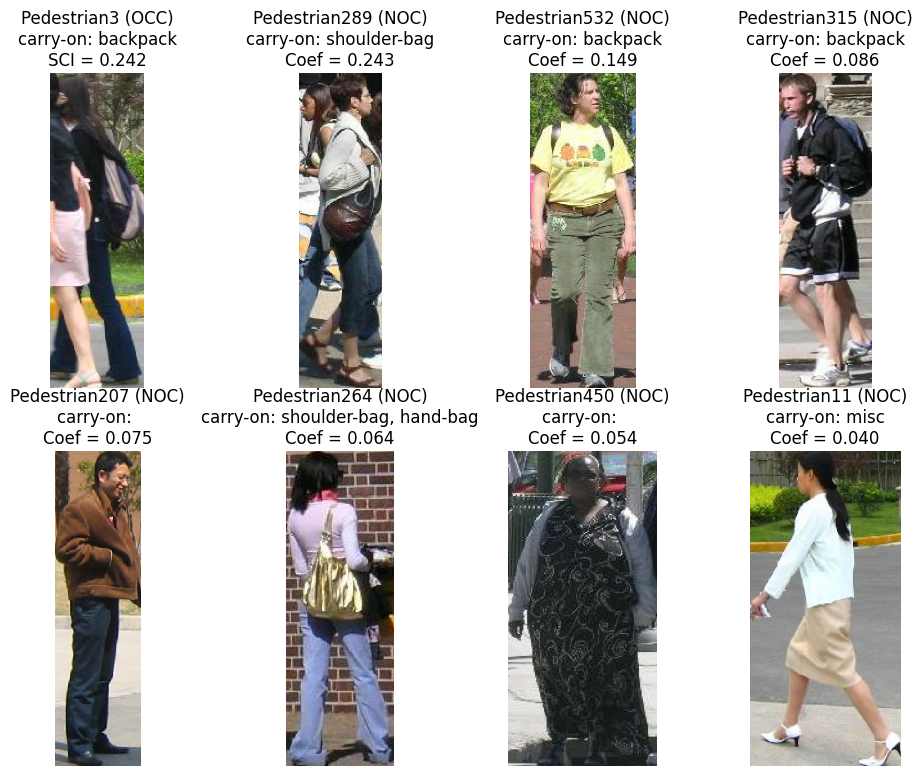

In [143]:
show_topk(3, 7)

In [144]:
def predict_occ(i, k):
    # Dl -> [n_train, 9]
    # xi -> [n_train]
    xi = np.abs(x[i])
    ids = np.argsort(xi)[::-1][:k]
    xi = xi[ids]
    #print(Dl[ids, 2], ids)
    occ = np.sum(Dl[ids, 2] * xi)
    return occ# / np.sum(xi)

i = 3
k = 10
gt = yl[i, 2]
pr = predict_occ(i, k)
gt, pr, crossentropy(pr, gt)

(1, 0.0, 18.420680743952364)

OCC detection F1 score: 0.44490006853085573


array([[199,   0],
       [135,   0]])

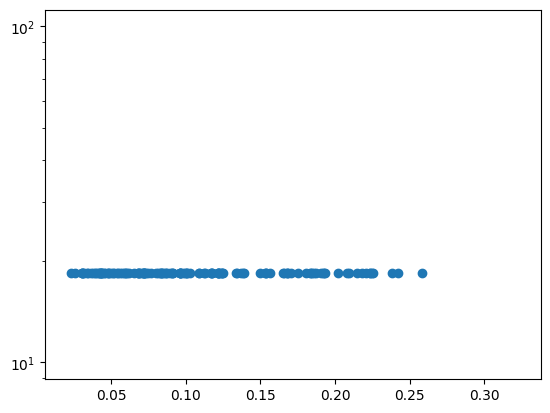

In [146]:
from sklearn.metrics import f1_score, confusion_matrix

prs = []
gts = []
ces = []
scis = sci(x)

for i in range(len(yl)):
    gt = yl[i, 2]
    pr = predict_occ(i, k=5)
    prs.append(np.round(pr))
    gts.append(gt)
    ces.append(crossentropy(pr, gt))

plt.scatter(scis, ces)
plt.yscale('log')
print('OCC detection F1 score:', f1_score(gts, prs, average='weighted'))
confusion_matrix(gts, prs)